In [1]:
#from google.colab import drive
#drive.mount('/content/drive')

## Import TensorFlow and other libraries

In [2]:
import tensorflow as tf

from tensorflow import keras
import os
import pathlib
import time
import datetime

from matplotlib import pyplot as plt
from IPython import display

import numpy as np

## Load the dataset

Download the CMP Facade Database data (30MB). Additional datasets are available in the same format [here](http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/). In Colab you can select other datasets from the drop-down menu. Note that some of the other datasets are significantly larger (`edges2handbags` is 8GB). 

In [3]:
with np.load('D:/Research/Data/Combined/nov-15-2020.npz') as dataset:
    data = dataset['data'].astype(np.float32)
    label = dataset['label'].astype(np.float32)

#month_names = ["feb", "mar", "may", "jun", "aug", "sep", "oct", "nov", "dec"]
month_names = ["feb", "mar", "may", "aug", "sep"]
for month_name in month_names:
    with np.load('D:/Research/Data/Combined/' + month_name + '-15-2020.npz') as dataset:
        data_curr = dataset['data'].astype(np.float32)
        label_curr = dataset['label'].astype(np.float32)
    data = np.concatenate((data, data_curr))
    label = np.concatenate((label, label_curr))

In [4]:
findata1 = np.concatenate((data[:,0:192,0:192,:],
                           data[:,0:192,192:384,:],
                           data[:,0:192,384:576,:],
                           data[:,192:384,0:192,:],
                           data[:,192:384,192:384,:],
                           data[:,192:384,384:576,:],
                           data[:,384:576,0:192,:],
                           data[:,384:576,192:384,:],
                           data[:,384:576,384:576,:],
                           data[:,576:768,0:192,:],
                           data[:,576:768,192:384,:],
                           data[:,576:768,384:576,:],
                           data[:,768:960,0:192,:],
                           data[:,768:960,192:384,:],
                           data[:,768:960,384:576,:]))
#traindataset = tf.data.Dataset.from_tensor_slices((data, label))

In [5]:
finlabel = np.concatenate((label[:,0:192,0:192],
                           label[:,0:192,192:384],
                           label[:,0:192,384:576],
                           label[:,192:384,0:192],
                           label[:,192:384,192:384],
                           label[:,192:384,384:576],
                           label[:,384:576,0:192],
                           label[:,384:576,192:384],
                           label[:,384:576,384:576],
                           label[:,576:768,0:192],
                           label[:,576:768,192:384],
                           label[:,576:768,384:576],
                           label[:,768:960,0:192],
                           label[:,768:960,192:384],
                           label[:,768:960,384:576]))
#traindataset = tf.data.Dataset.from_tensor_slices((data, label))

In [6]:
print(findata1.shape)
print(findata1.dtype)
print(finlabel.shape)
print(finlabel.dtype)
print(len(finlabel))

(5835, 192, 192, 4)
float32
(5835, 192, 192)
float32
5835


In [7]:
def plotdat(data,label,index):
    B = data[index,:,:,0]
    G = data[index,:,:,1]
    R = data[index,:,:,2]
    NIR = data[index,:,:,3]
    cloud_mask = label[index,:,:]
    
    plt.subplot(2, 3, 1)
    plt.imshow(B, cmap='gray')
    plt.axis('off')
    plt.subplot(2, 3, 2)
    plt.imshow(G, cmap='gray')
    plt.axis('off')
    plt.subplot(2, 3, 3)
    plt.imshow(R, cmap='gray')
    plt.axis('off')
    plt.subplot(2, 3, 4)
    plt.imshow(NIR, cmap='gray')
    plt.axis('off')
    plt.subplot(2, 3, 5)
    plt.imshow(cloud_mask, cmap='gray')
    plt.axis('off')
    plt.show()

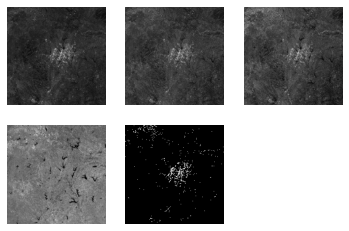

In [8]:
plotdat(findata1,finlabel,np.random.randint(len(findata1)))

In [9]:
# datanormialized = findata1/400 - 1

log_data = findata1 # np.log10(findata1 + 1) # log10?
print(log_data.shape)

max_data = np.max(log_data,axis=(2,1,0))
min_data = np.min(log_data,axis=(2,1,0))
print(max_data.shape, min_data.shape)
print(max_data, min_data)

data_norm = 2*(log_data-min_data)/(max_data-min_data) - 1 # [-1, 1]
# data_norm = (log_data-min_data)/(max_data-min_data) # [0, 1]
print(np.max(data_norm), np.min(data_norm))




(5835, 192, 192, 4)
(4,) (4,)
[65528. 65528. 23443. 65528.] [327. 230. 127.  99.]
1.0 -1.0


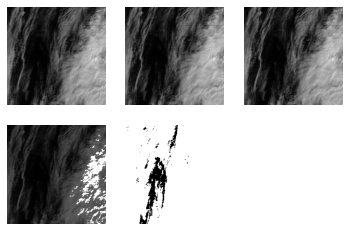

In [10]:
plotdat(data_norm,finlabel,np.random.randint(len(finlabel)))

In [11]:
data_norm[-20:].shape

(20, 192, 192, 4)

In [12]:
#Form dataset
train_dataset = tf.data.Dataset.from_tensor_slices((data_norm[:-20], finlabel[:-20]))
test_dataset = tf.data.Dataset.from_tensor_slices((data_norm[-20:], finlabel[-20:]))

In [13]:
BUFFER_SIZE = 400
BATCH_SIZE = 1
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)
test_dataset = test_dataset.batch(BATCH_SIZE)

In [14]:
test_dataset

<BatchDataset element_spec=(TensorSpec(shape=(None, 192, 192, 4), dtype=tf.float32, name=None), TensorSpec(shape=(None, 192, 192), dtype=tf.float32, name=None))>

Define the generator

In [15]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, concatenate, Conv2D, MaxPooling2D, Conv2DTranspose, BatchNormalization,\
    Activation, Dropout, add

from tensorflow.keras.optimizers import Adam
from tensorflow.keras import backend as K

"""
Some parts borrowed from https://www.kaggle.com/cjansen/u-net-in-keras
"""


def bn_relu(input_tensor):
    """It adds a Batch_normalization layer before a Relu
    """
    input_tensor = BatchNormalization(axis=3)(input_tensor)
    return Activation("relu")(input_tensor)


def contr_arm(input_tensor, filters, kernel_size):
    """It adds a feedforward signal to the output of two following conv layers in contracting path
       TO DO: remove keras.layers.add and replace it with add only
    """

    x = Conv2D(filters, kernel_size, padding='same')(input_tensor)
    x = bn_relu(x)

    x = Conv2D(filters, kernel_size, padding='same')(x)
    x = bn_relu(x)

    filters_b = filters // 2
    kernel_size_b = (kernel_size[0]-2, kernel_size[0]-2)  # creates a kernl size of (1,1) out of (3,3)

    x1 = Conv2D(filters_b, kernel_size_b, padding='same')(input_tensor)
    x1 = bn_relu(x1)

    x1 = concatenate([input_tensor, x1], axis=3)
    x = keras.layers.add([x, x1])
    x = Activation("relu")(x)
    return x


def imprv_contr_arm(input_tensor, filters, kernel_size ):
    """It adds a feedforward signal to the output of two following conv layers in contracting path
    """

    x = Conv2D(filters, kernel_size, padding='same')(input_tensor)
    x = bn_relu(x)

    x0 = Conv2D(filters, kernel_size, padding='same')(x)
    x0 = bn_relu(x0)

    x = Conv2D(filters, kernel_size, padding='same')(x0)
    x = bn_relu(x)

    filters_b = filters // 2
    kernel_size_b = (kernel_size[0]-2, kernel_size[0]-2)  # creates a kernl size of (1,1) out of (3,3)

    x1 = Conv2D(filters_b, kernel_size_b, padding='same')(input_tensor)
    x1 = bn_relu(x1)

    x1 = concatenate([input_tensor, x1], axis=3)

    x2 = Conv2D(filters, kernel_size_b, padding='same')(x0)
    x2 = bn_relu(x2)

    x = keras.layers.add([x, x1, x2])
    x = Activation("relu")(x)
    return x


def bridge(input_tensor, filters, kernel_size):
    """It is exactly like the identity_block plus a dropout layer. This block only uses in the valley of the UNet
    """

    x = Conv2D(filters, kernel_size, padding='same')(input_tensor)
    x = bn_relu(x)

    x = Conv2D(filters, kernel_size, padding='same')(x)
    x = Dropout(.15)(x)
    x = bn_relu(x)

    filters_b = filters // 2
    kernel_size_b = (kernel_size[0]-2, kernel_size[0]-2)  # creates a kernl size of (1,1) out of (3,3)

    x1 = Conv2D(filters_b, kernel_size_b, padding='same')(input_tensor)
    x1 = bn_relu(x1)

    x1 = concatenate([input_tensor, x1], axis=3)
    x = keras.layers.add([x, x1])
    x = Activation("relu")(x)
    return x


def conv_block_exp_path(input_tensor, filters, kernel_size):
    """It Is only the convolution part inside each expanding path's block
    """

    x = Conv2D(filters, kernel_size, padding='same')(input_tensor)
    x = bn_relu(x)

    x = Conv2D(filters, kernel_size, padding='same')(x)
    x = bn_relu(x)
    return x


def conv_block_exp_path3(input_tensor, filters, kernel_size):
    """It Is only the convolution part inside each expanding path's block
    """

    x = Conv2D(filters, kernel_size, padding='same')(input_tensor)
    x = bn_relu(x)

    x = Conv2D(filters, kernel_size, padding='same')(x)
    x = bn_relu(x)

    x = Conv2D(filters, kernel_size, padding='same')(x)
    x = bn_relu(x)
    return x


def add_block_exp_path(input_tensor1, input_tensor2, input_tensor3):
    """It is for adding two feed forwards to the output of the two following conv layers in expanding path
    """

    x = keras.layers.add([input_tensor1, input_tensor2, input_tensor3])
    x = Activation("relu")(x)
    return x


def improve_ff_block4(input_tensor1, input_tensor2 ,input_tensor3, input_tensor4, pure_ff):
    """It improves the skip connection by using previous layers feature maps
       TO DO: shrink all of ff blocks in one function/class
    """

    for ix in range(1):
        if ix == 0:
            x1 = input_tensor1
        x1 = concatenate([x1, input_tensor1], axis=3)
    x1 = MaxPooling2D(pool_size=(2, 2))(x1)

    for ix in range(3):
        if ix == 0:
            x2 = input_tensor2
        x2 = concatenate([x2, input_tensor2], axis=3)
    x2 = MaxPooling2D(pool_size=(4, 4))(x2)

    for ix in range(7):
        if ix == 0:
            x3 = input_tensor3
        x3 = concatenate([x3, input_tensor3], axis=3)
    x3 = MaxPooling2D(pool_size=(8, 8))(x3)

    for ix in range(15):
        if ix == 0:
            x4 = input_tensor4
        x4 = concatenate([x4, input_tensor4], axis=3)
    x4 = MaxPooling2D(pool_size=(16, 16))(x4)

    x = keras.layers.add([x1, x2, x3, x4, pure_ff])
    x = Activation("relu")(x)
    return x


def improve_ff_block3(input_tensor1, input_tensor2, input_tensor3, pure_ff):
    """It improves the skip connection by using previous layers feature maps
    """

    for ix in range(1):
        if ix == 0:
            x1 = input_tensor1
        x1 = concatenate([x1, input_tensor1], axis=3)
    x1 = MaxPooling2D(pool_size=(2, 2))(x1)

    for ix in range(3):
        if ix == 0:
            x2 = input_tensor2
        x2 = concatenate([x2, input_tensor2], axis=3)
    x2 = MaxPooling2D(pool_size=(4, 4))(x2)

    for ix in range(7):
        if ix == 0:
            x3 = input_tensor3
        x3 = concatenate([x3, input_tensor3], axis=3)
    x3 = MaxPooling2D(pool_size=(8, 8))(x3)

    x = keras.layers.add([x1, x2, x3, pure_ff])
    x = Activation("relu")(x)
    return x


def improve_ff_block2(input_tensor1, input_tensor2, pure_ff):
    """It improves the skip connection by using previous layers feature maps
    """

    for ix in range(1):
        if ix == 0:
            x1 = input_tensor1
        x1 = concatenate([x1, input_tensor1], axis=3)
    x1 = MaxPooling2D(pool_size=(2, 2))(x1)

    for ix in range(3):
        if ix == 0:
            x2 = input_tensor2
        x2 = concatenate([x2, input_tensor2], axis=3)
    x2 = MaxPooling2D(pool_size=(4, 4))(x2)

    x = keras.layers.add([x1, x2, pure_ff])
    x = Activation("relu")(x)
    return x


def improve_ff_block1(input_tensor1, pure_ff):
    """It improves the skip connection by using previous layers feature maps
    """

    for ix in range(1):
        if ix == 0:
            x1 = input_tensor1
        x1 = concatenate([x1, input_tensor1], axis=3)
    x1 = MaxPooling2D(pool_size=(2, 2))(x1)

    x = keras.layers.add([x1, pure_ff])
    x = Activation("relu")(x)
    return x


def model_arch(input_rows=192, input_cols=192, num_of_channels=4, num_of_classes=1):
    inputs = Input((input_rows, input_cols, num_of_channels))
    conv1 = Conv2D(16, (3, 3), activation='relu', padding='same')(inputs)

    conv1 = contr_arm(conv1, 32, (3, 3))
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = contr_arm(pool1, 64, (3, 3))
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = contr_arm(pool2, 128, (3, 3))
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = contr_arm(pool3, 256, (3, 3))
    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)

    conv5 = imprv_contr_arm(pool4, 512, (3, 3))
    pool5 = MaxPooling2D(pool_size=(2, 2))(conv5)

    conv6 = bridge(pool5, 1024, (3, 3))

    convT7 = Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(conv6)
    prevup7 = improve_ff_block4(input_tensor1=conv4, input_tensor2=conv3, input_tensor3=conv2, input_tensor4=conv1, pure_ff=conv5)
    up7 = concatenate([convT7, prevup7], axis=3)
    conv7 = conv_block_exp_path3(input_tensor=up7, filters=512, kernel_size=(3, 3))
    conv7 = add_block_exp_path(conv7, conv5, convT7)

    convT8 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv7)
    prevup8 = improve_ff_block3(input_tensor1=conv3, input_tensor2=conv2, input_tensor3=conv1, pure_ff=conv4)
    up8 = concatenate([convT8, prevup8], axis=3)
    conv8 = conv_block_exp_path(input_tensor=up8, filters=256, kernel_size=(3, 3))
    conv8 = add_block_exp_path(input_tensor1=conv8, input_tensor2=conv4, input_tensor3=convT8)

    convT9 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv8)
    prevup9 = improve_ff_block2(input_tensor1=conv2, input_tensor2=conv1, pure_ff=conv3)
    up9 = concatenate([convT9, prevup9], axis=3)
    conv9 = conv_block_exp_path(input_tensor=up9, filters=128, kernel_size=(3, 3))
    conv9 = add_block_exp_path(input_tensor1=conv9, input_tensor2=conv3, input_tensor3=convT9)

    convT10 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv9)
    prevup10 = improve_ff_block1(input_tensor1=conv1, pure_ff=conv2)
    up10 = concatenate([convT10, prevup10], axis=3)
    conv10 = conv_block_exp_path(input_tensor=up10, filters=64, kernel_size=(3, 3))
    conv10 = add_block_exp_path(input_tensor1=conv10, input_tensor2=conv2, input_tensor3=convT10)

    convT11 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(conv10)
    up11 = concatenate([convT11, conv1], axis=3)
    conv11 = conv_block_exp_path(input_tensor=up11, filters=32, kernel_size=(3, 3))
    conv11 = add_block_exp_path(input_tensor1=conv11, input_tensor2=conv1, input_tensor3=convT11)

    conv12 = Conv2D(num_of_classes, (1, 1), activation='sigmoid')(conv11)

    return Model(inputs=[inputs], outputs=[conv12])

Visualize the generator model architecture:

In [16]:
n_in_channels = 4
n_out_channels = 1
generator =  model_arch(192,192,n_in_channels,n_out_channels)
#generator =  simplified_model_arch(128,128,4,1)
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model/model_to_dot to work.


### Define the generator loss
- jacc_coef: loss for cloundnet
- generator loss: gan_loss + LAMBDA * l1_loss for pix2pix

In [17]:
smooth = 0.0000001
def jacc_coef(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return 1 - ((intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) - intersection + smooth))
    
# LAMBDA = 100   
# loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)
def generator_loss(gen_output, target):
    # gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

    # Jaccard loss (or IOU)
    jacc_loss = jacc_coef(target,  gen_output)
    # Mean absolute error
    # l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

    # total_gen_loss = gan_loss + (LAMBDA * l1_loss)

    #return l1_loss
    return jacc_loss




The training procedure for the generator is as follows:

## Define the optimizers and a checkpoint-saver


In [18]:
lr_schedule = keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=1e-4,
    decay_steps=10000,
    decay_rate=0.7)

# lr=0.000001
# lr=2e-4
# generator_optimizer = tf.keras.optimizers.Adam(lr, beta_1=0.5)
generator_optimizer = tf.keras.optimizers.Adam(lr_schedule, beta_1=0.5)
#discriminator_optimizer = tf.keras.optimizers.Adam(lr, beta_1=0.5)

In [19]:
checkpoint_dir = 'D:/Research/Data/Checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 generator=generator)
# checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
#                                  discriminator_optimizer=discriminator_optimizer,
#                                  generator=generator,
#                                  discriminator=discriminator)

## Generate images

Write a function to plot some images during training.

- Pass images from the test set to the generator.
- The generator will then translate the input image into the output.
- The last step is to plot the predictions and _voila_!

In [20]:
def generate_images(model, test_input, tar):
    prediction = model(test_input, training=False)
    plt.figure(figsize=(15, 15))

    mae = tf.reduce_mean(tf.abs(prediction-tar)).numpy()
    rmse = np.sqrt(tf.reduce_mean(tf.square(prediction-tar)).numpy())

    print("MAE, RMSE = ", mae, rmse)

    #print(prediction[0])
    display_list = [test_input[0,:,:,0],test_input[0,:,:,1],test_input[0,:,:,2],test_input[0,:,:,3], tar[0], prediction[0,:,:,0]]
    print(prediction.shape)
    print(tar[...,tf.newaxis].shape)
    title = ['Input ImageB','Input ImageG','Input ImageR','Input ImageNIR','Ground Truth', 'Predicted Image']

    for i in range(6):
        plt.subplot(2, 3, i+1)
        plt.title(title[i])
        im = display_list[i]
        plt.imshow(im, cmap="gray")
        plt.axis('off')
    plt.show()

    target_mask = tar[0] > 0.5
    pred_mask = prediction[0,:,:,0] > 0.5

    mae_cloud_mask = tf.reduce_mean(tf.abs(tf.cast(pred_mask, tf.float32)-tf.cast(target_mask, tf.float32))).numpy()
    rmse_cloud_mask = np.sqrt(tf.reduce_mean(tf.square(tf.cast(pred_mask, tf.float32)-tf.cast(target_mask, tf.float32))).numpy())

    print("MAE_cloud_mask, RMSE_cloud_mask = ", mae_cloud_mask, rmse_cloud_mask)


    # print('target_mask, pred_mask', np.sum(target_mask), np.sum(pred_mask))

    TP = np.sum(np.logical_and(target_mask, pred_mask))
    FP = np.sum(pred_mask) - TP
    FN = np.sum(target_mask) - TP
    TN = test_input.shape[1] * test_input.shape[2] - np.sum(target_mask) - FP

    print('TP, FP, FN, TN = ', TP, FP, FN, TN)

    epsilon = 1.0e-10
    IOU = (TP+epsilon) / (TP+FN+FP+epsilon)
    precision = (TP +epsilon) / (TP + FP +epsilon)
    recall = (TP +epsilon) / (TP + FN +epsilon)
    specificity = (TN + epsilon) / (TN + FP + epsilon)
    overall_accuracy = (TP + TN +epsilon) / (TP + TN + FP + FN +epsilon)


    # IOU = np.sum(np.logical_and(target_mask, pred_mask)) / np.sum(np.logical_or(target_mask, pred_mask))
    print('IOU, precision, recall, speicificity, overall_accuracy = ', IOU, precision, recall, specificity, overall_accuracy)

    return IOU, precision, recall, specificity, overall_accuracy

MAE, RMSE =  0.5087701 0.56532824
(1, 192, 192, 1)
(1, 192, 192, 1)


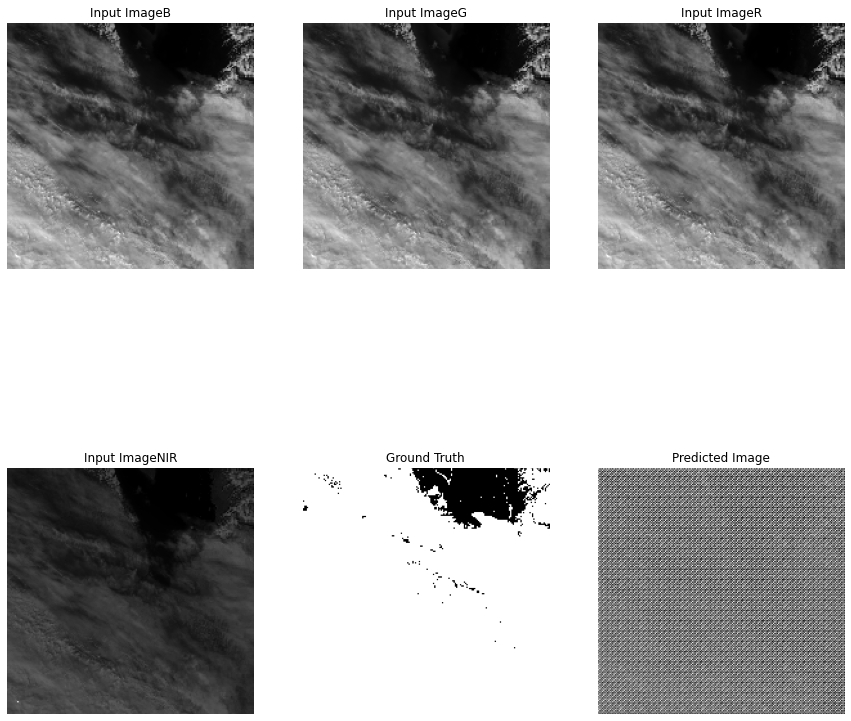

MAE_cloud_mask, RMSE_cloud_mask =  0.52039933 0.7213871
TP, FP, FN, TN =  16031 1529 17655 1649
IOU, precision, recall, speicificity, overall_accuracy =  0.45523214539258994 0.912927107061504 0.4758950305765022 0.5188797986154966 0.4796006944444458


In [21]:
for example_input, example_target in test_dataset.take(1):
  IOU, precision, recall, specificity, overall_accuracy = generate_images(generator, example_input, example_target)

## Training

- For each example input generates an output.
- The discriminator receives the `input_image` and the generated image as the first input. The second input is the `input_image` and the `target_image`.
- Next, calculate the generator and the discriminator loss.
- Then, calculate the gradients of loss with respect to both the generator and the discriminator variables(inputs) and apply those to the optimizer.
- Finally, log the losses to TensorBoard.

In [22]:
log_dir="D:/Research/Data/Logs/"

summary_writer = tf.summary.create_file_writer(
    log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [23]:
@tf.function
def train_step(input_image, target, step):
    with tf.GradientTape() as gen_tape:
        gen_output = generator(input_image, training=True)

        gen_l1_loss = generator_loss(gen_output, target[...,tf.newaxis])
        
    generator_gradients = gen_tape.gradient(gen_l1_loss,
                                            generator.trainable_variables)
    
    generator_optimizer.apply_gradients(zip(generator_gradients,
                                            generator.trainable_variables))
    
    with summary_writer.as_default():
        tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=step//100)

In [24]:
def fit(train_ds, test_ds, steps):
    example_input, example_target = next(iter(test_ds.take(1)))
    # td_iter = iter(test_ds.take(6))
    start = time.time()

    for step, (input_image, target) in train_ds.repeat().take(steps).enumerate():
        if (step) % 1000 == 0:
            display.clear_output(wait=True)

            if step != 0:
                print(f'Time taken for 1000 steps: {time.time()-start:.2f} sec\n')

            start = time.time()
            # example_input, example_target = next(td_iter)
            generate_images(generator, example_input, example_target)
            print(f"Step: {step//1000}k")

        train_step(input_image, target, step)

        # Training step
        if (step+1) % 10 == 0:
            print('.', end='', flush=True)


        # Save (checkpoint) the model every 5k steps
        if (step + 1) % 5000 == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)


This training loop saves logs that you can view in TensorBoard to monitor the training progress.

If you work on a local machine, you would launch a separate TensorBoard process. When working in a notebook, launch the viewer before starting the training to monitor with TensorBoard.

To launch the viewer paste the following into a code-cell:

In [25]:
%reload_ext tensorboard
%tensorboard --logdir {log_dir}

Finally, run the training loop:

Time taken for 1000 steps: 52.95 sec

MAE, RMSE =  0.18358234 0.4250934
(1, 192, 192, 1)
(1, 192, 192, 1)


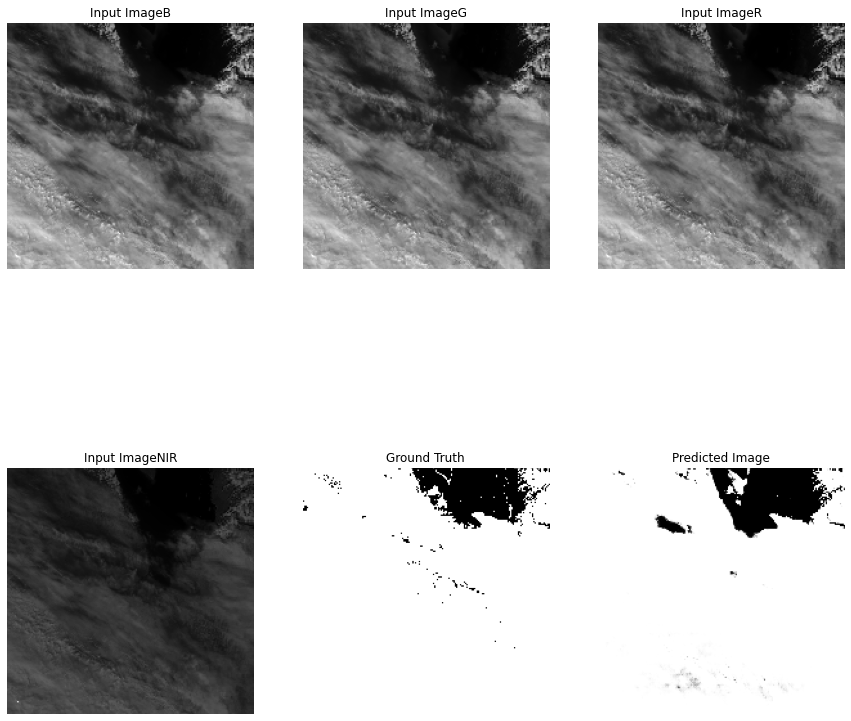

MAE_cloud_mask, RMSE_cloud_mask =  0.029188368 0.17084603
TP, FP, FN, TN =  32957 347 729 2831
IOU, precision, recall, speicificity, overall_accuracy =  0.9683836276555109 0.9895808311313956 0.9783589621801343 0.8908118313404692 0.9708116319444445
Step: 199k
....................................................................................................

In [26]:
fit(train_dataset, test_dataset, steps=200000)

You can view the [results of a previous run](https://tensorboard.dev/experiment/lZ0C6FONROaUMfjYkVyJqw) of this notebook on [TensorBoard.dev](https://tensorboard.dev/).

TensorBoard.dev is a managed experience for hosting, tracking, and sharing ML experiments with everyone.

It can also included inline using an `<iframe>`:

In [ ]:
display.IFrame(
    src="https://tensorboard.dev/experiment/lZ0C6FONROaUMfjYkVyJqw",
    width="100%",
    height="1000px")

Interpreting the logs is more subtle when training a GAN (or a cGAN like pix2pix) compared to a simple classification or regression model. Things to look for:

- Check that neither the generator nor the discriminator model has "won". If either the `gen_gan_loss` or the `disc_loss` gets very low, it's an indicator that this model is dominating the other, and you are not successfully training the combined model.
- The value `log(2) = 0.69` is a good reference point for these losses, as it indicates a perplexity of 2 - the discriminator is, on average, equally uncertain about the two options.
- For the `disc_loss`, a value below `0.69` means the discriminator is doing better than random on the combined set of real and generated images.
- For the `gen_gan_loss`, a value below `0.69` means the generator is doing better than random at fooling the discriminator.
- As training progresses, the `gen_l1_loss` should go down.

In [ ]:
# Restoring the latest checkpoint in checkpoint_dir
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

MAE, RMSE =  0.18041448 0.4213769
(1, 192, 192, 1)
(1, 192, 192, 1)


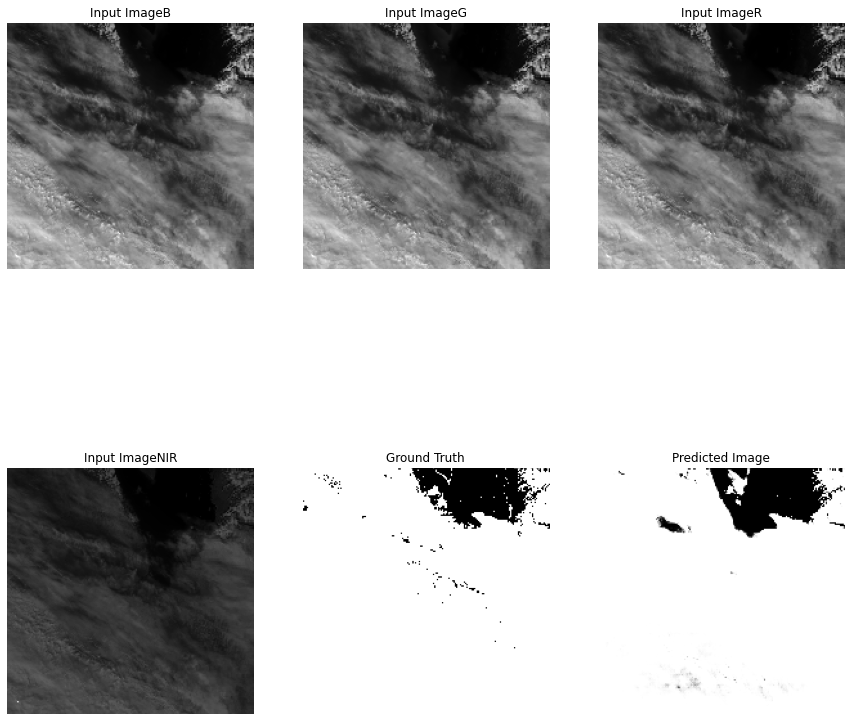

MAE_cloud_mask, RMSE_cloud_mask =  0.027479384 0.16576907
TP, FP, FN, TN =  33048 375 638 2803
IOU, precision, recall, speicificity, overall_accuracy =  0.9702592407739057 0.9887801813122701 0.9810603811672506 0.8820012586532447 0.9725206163194445
MAE, RMSE =  0.2091956 0.4543766
(1, 192, 192, 1)
(1, 192, 192, 1)


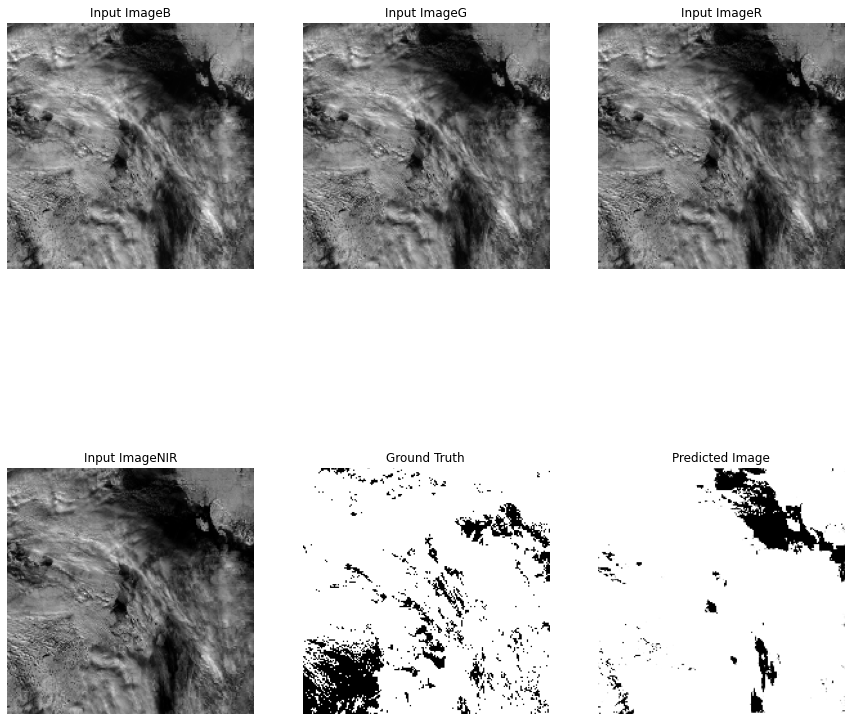

MAE_cloud_mask, RMSE_cloud_mask =  0.18915473 0.4349192
TP, FP, FN, TN =  29019 4598 2375 872
IOU, precision, recall, speicificity, overall_accuracy =  0.8062625027783956 0.8632239640658004 0.9243486016436264 0.15941499085924754 0.8108452690972227
MAE, RMSE =  0.42726216 0.62735283
(1, 192, 192, 1)
(1, 192, 192, 1)


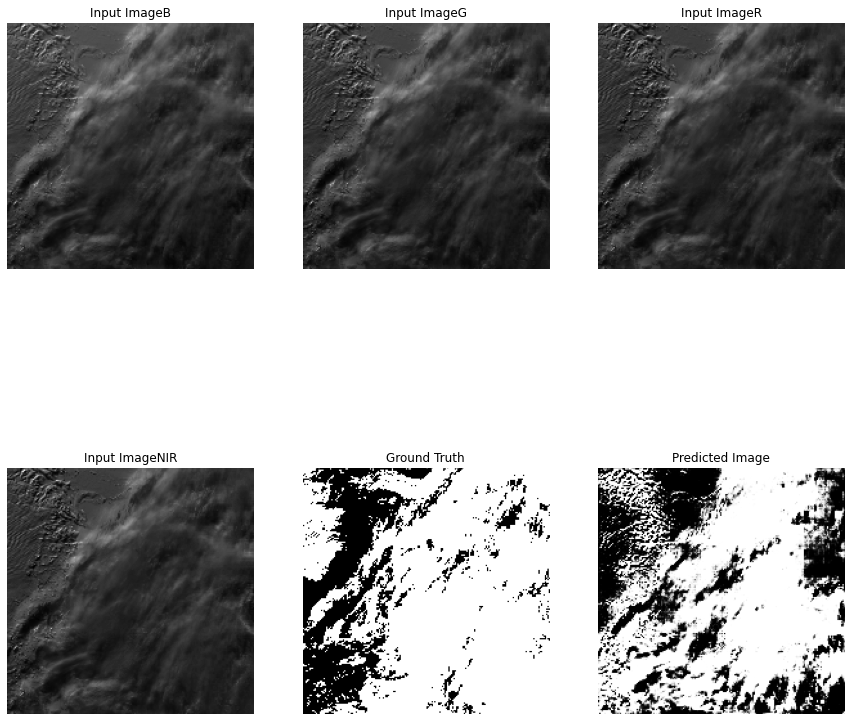

MAE_cloud_mask, RMSE_cloud_mask =  0.33379447 0.5777495
TP, FP, FN, TN =  19311 4354 7951 5248
IOU, precision, recall, speicificity, overall_accuracy =  0.6107983299595153 0.8160152123388978 0.708348617122736 0.5465528014996923 0.6662055121527786
MAE, RMSE =  0.4820665 0.6908112
(1, 192, 192, 1)
(1, 192, 192, 1)


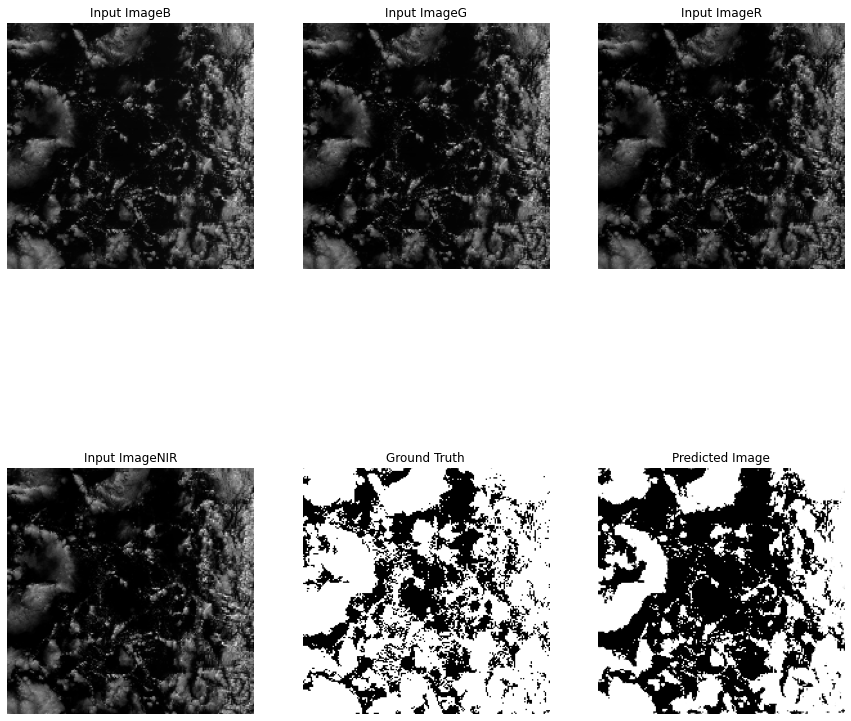

MAE_cloud_mask, RMSE_cloud_mask =  0.19675022 0.44356537
TP, FP, FN, TN =  17145 224 7029 12466
IOU, precision, recall, speicificity, overall_accuracy =  0.7027215345520137 0.9871034601876908 0.7092330603127339 0.9823483057525612 0.8032497829861116
MAE, RMSE =  0.048920486 0.21147692
(1, 192, 192, 1)
(1, 192, 192, 1)


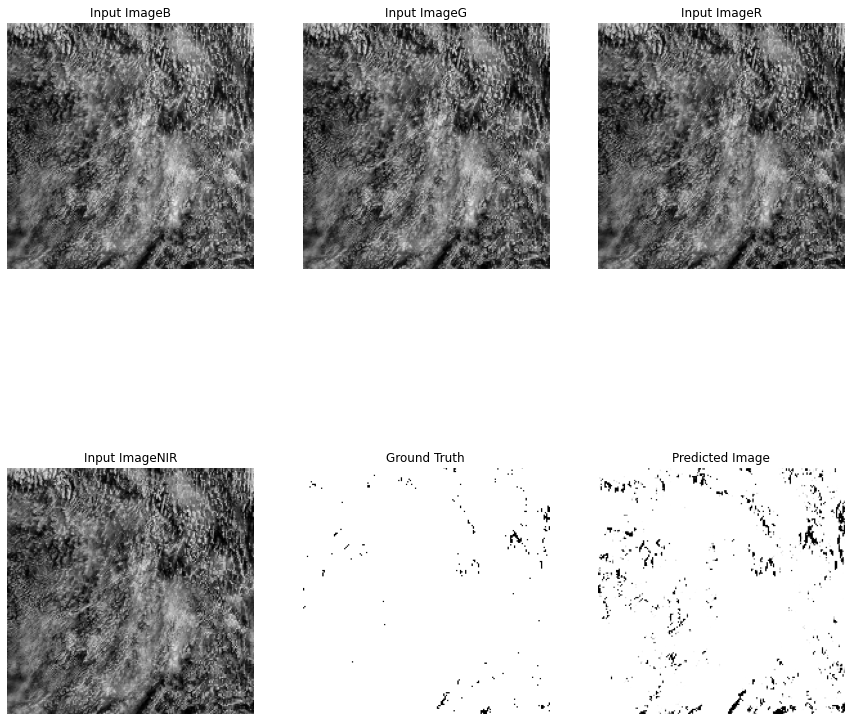

MAE_cloud_mask, RMSE_cloud_mask =  0.03274197 0.18094742
TP, FP, FN, TN =  35353 9 1198 304
IOU, precision, recall, speicificity, overall_accuracy =  0.9669857768052518 0.9997454895085119 0.9672238789636399 0.9712460063897855 0.967258029513889
MAE, RMSE =  0.047152802 0.21100865
(1, 192, 192, 1)
(1, 192, 192, 1)


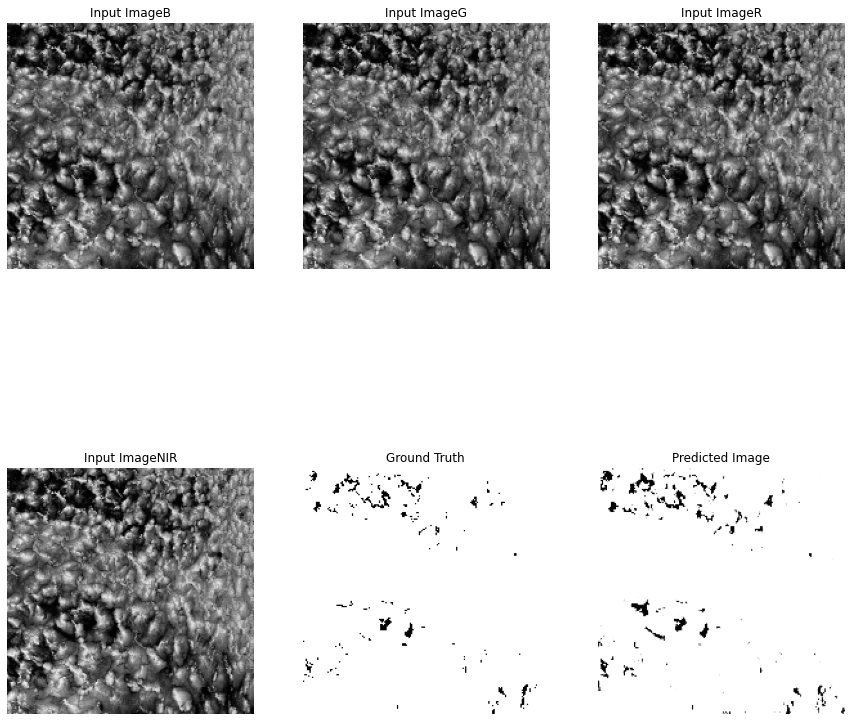

MAE_cloud_mask, RMSE_cloud_mask =  0.0152994795 0.12369107
TP, FP, FN, TN =  35696 105 459 604
IOU, precision, recall, speicificity, overall_accuracy =  0.9844456701599559 0.9970671210301388 0.9873046604895589 0.851904090268004 0.9847005208333334
MAE, RMSE =  0.26911753 0.50960934
(1, 192, 192, 1)
(1, 192, 192, 1)


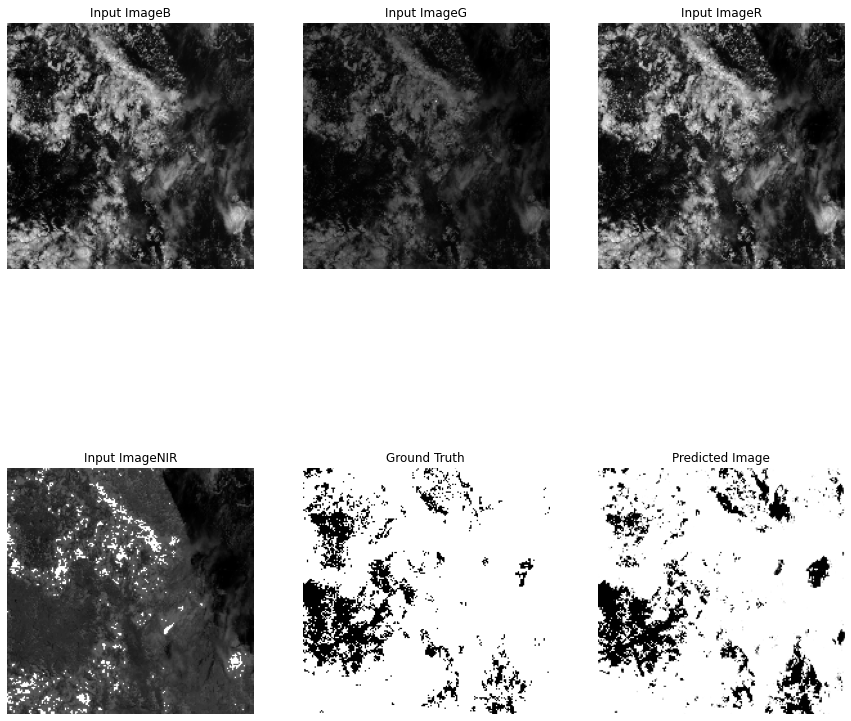

MAE_cloud_mask, RMSE_cloud_mask =  0.08544922 0.29231697
TP, FP, FN, TN =  29479 1396 1754 4235
IOU, precision, recall, speicificity, overall_accuracy =  0.9034601121701556 0.9547854251012147 0.9438414497486635 0.752086663114904 0.9145507812500002
MAE, RMSE =  0.14557193 0.3763314
(1, 192, 192, 1)
(1, 192, 192, 1)


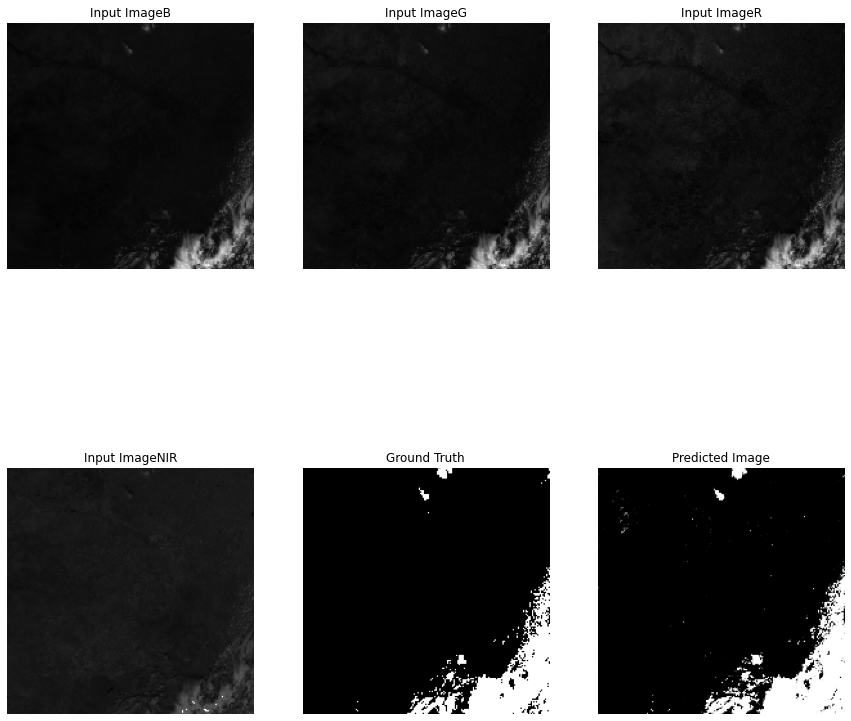

MAE_cloud_mask, RMSE_cloud_mask =  0.01586914 0.12597278
TP, FP, FN, TN =  3393 445 140 32886
IOU, precision, recall, speicificity, overall_accuracy =  0.852941176470592 0.8840541948931766 0.9603736201528458 0.9866490654345804 0.984130859375
MAE, RMSE =  0.085132584 0.28605208
(1, 192, 192, 1)
(1, 192, 192, 1)


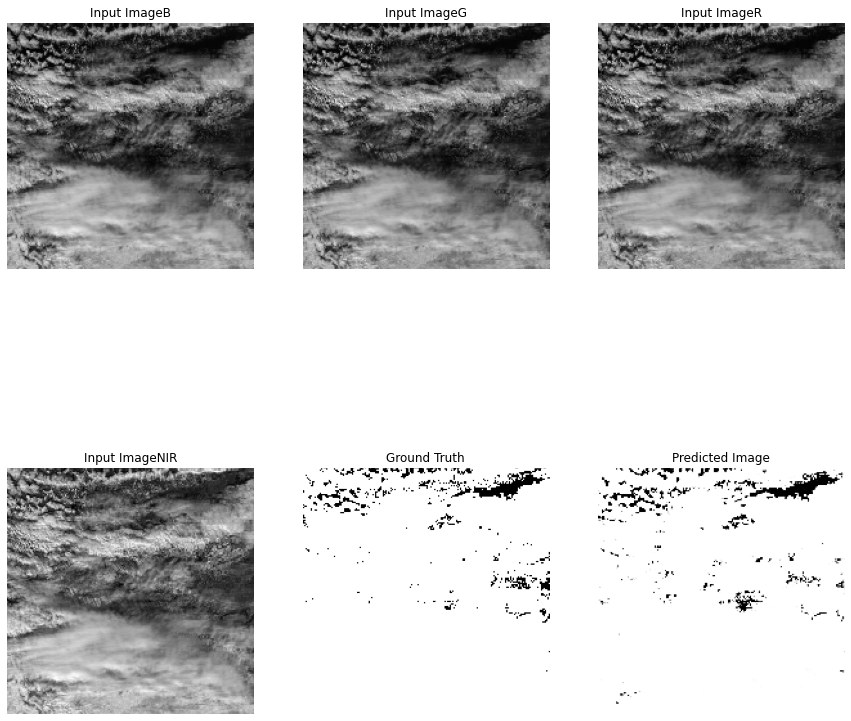

MAE_cloud_mask, RMSE_cloud_mask =  0.026204428 0.16187781
TP, FP, FN, TN =  34754 456 510 1144
IOU, precision, recall, speicificity, overall_accuracy =  0.9729563269876821 0.9870491337688158 0.9855376588021779 0.7150000000000178 0.9737955729166667
MAE, RMSE =  0.00049682515 0.008630388
(1, 192, 192, 1)
(1, 192, 192, 1)


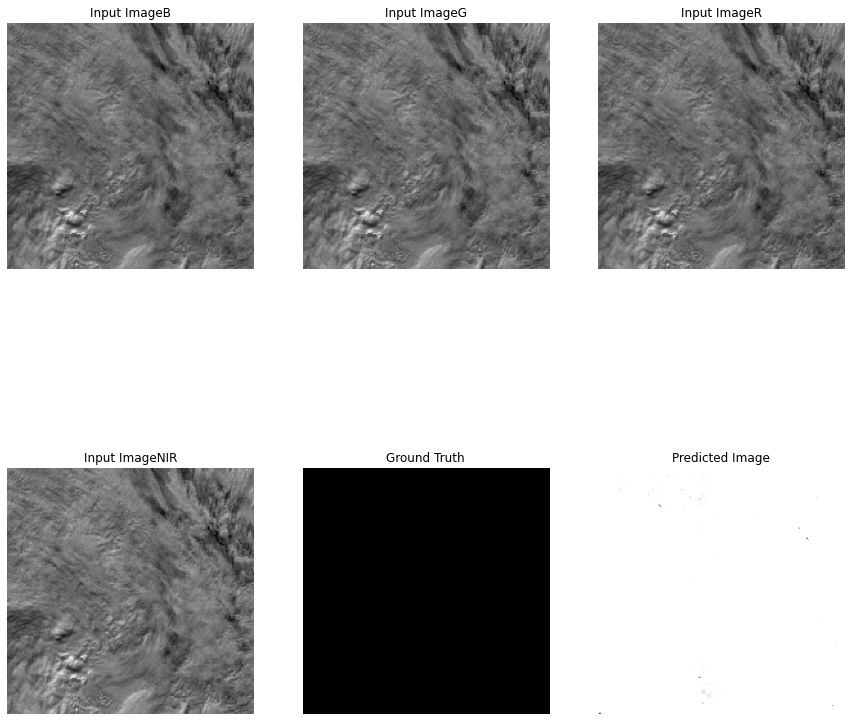

MAE_cloud_mask, RMSE_cloud_mask =  8.138021e-05 0.009021098
TP, FP, FN, TN =  36861 0 3 0
IOU, precision, recall, speicificity, overall_accuracy =  0.9999186197916666 1.0 0.9999186197916666 1.0 0.9999186197916666
MAE, RMSE =  0.45853353 0.673695
(1, 192, 192, 1)
(1, 192, 192, 1)


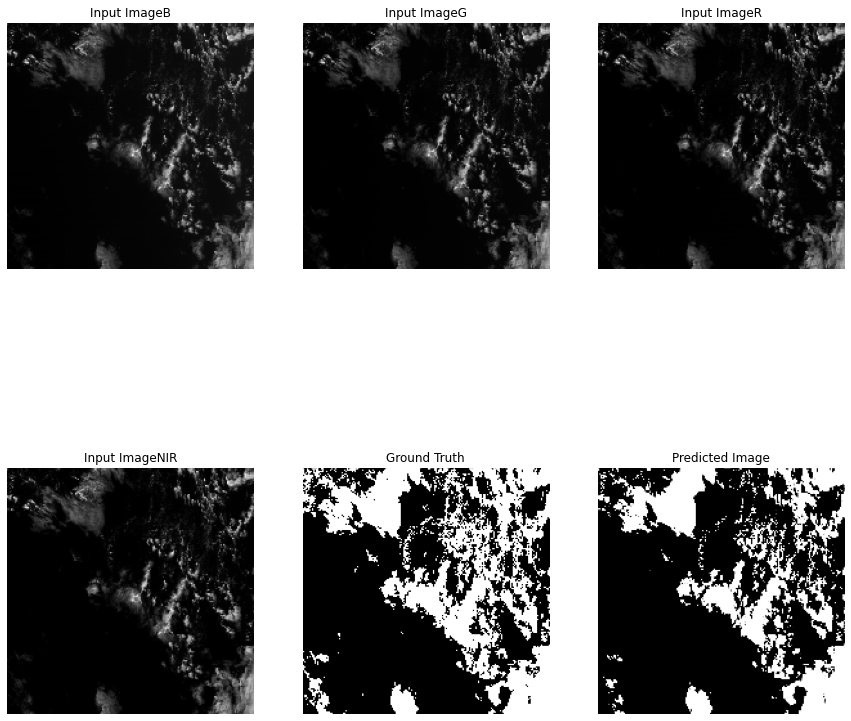

MAE_cloud_mask, RMSE_cloud_mask =  0.08235677 0.2869787
TP, FP, FN, TN =  9949 123 2913 23879
IOU, precision, recall, speicificity, overall_accuracy =  0.7661917597227589 0.9877879269261319 0.773518892862698 0.994875427047746 0.9176432291666669
MAE, RMSE =  0.46202466 0.67348295
(1, 192, 192, 1)
(1, 192, 192, 1)


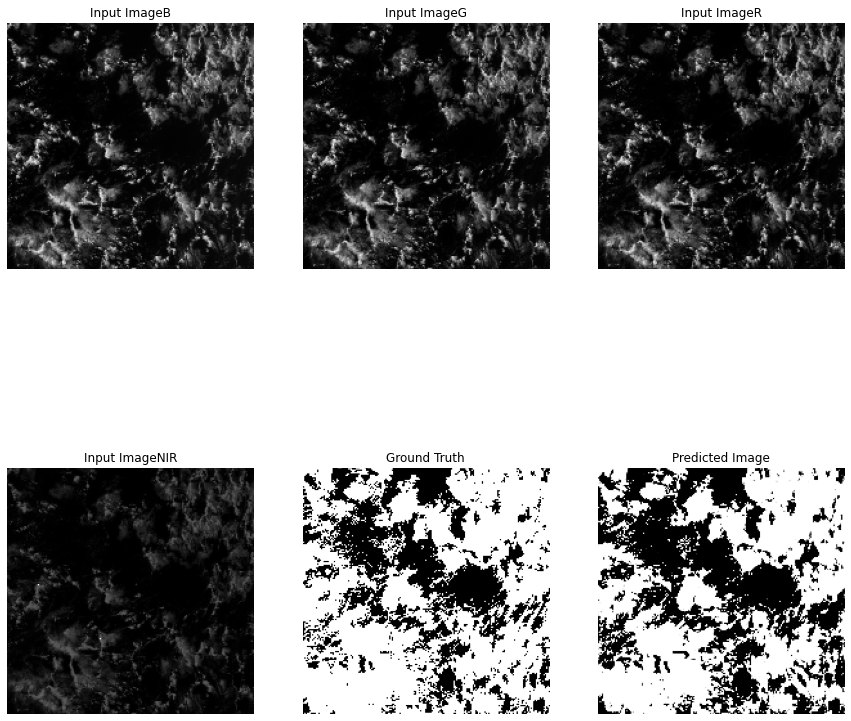

MAE_cloud_mask, RMSE_cloud_mask =  0.10837131 0.32919797
TP, FP, FN, TN =  20744 254 3741 12125
IOU, precision, recall, speicificity, overall_accuracy =  0.838514087069001 0.9879036098676065 0.8472125791300803 0.9794813797560387 0.8916286892361114
MAE, RMSE =  0.032570332 0.17486854
(1, 192, 192, 1)
(1, 192, 192, 1)


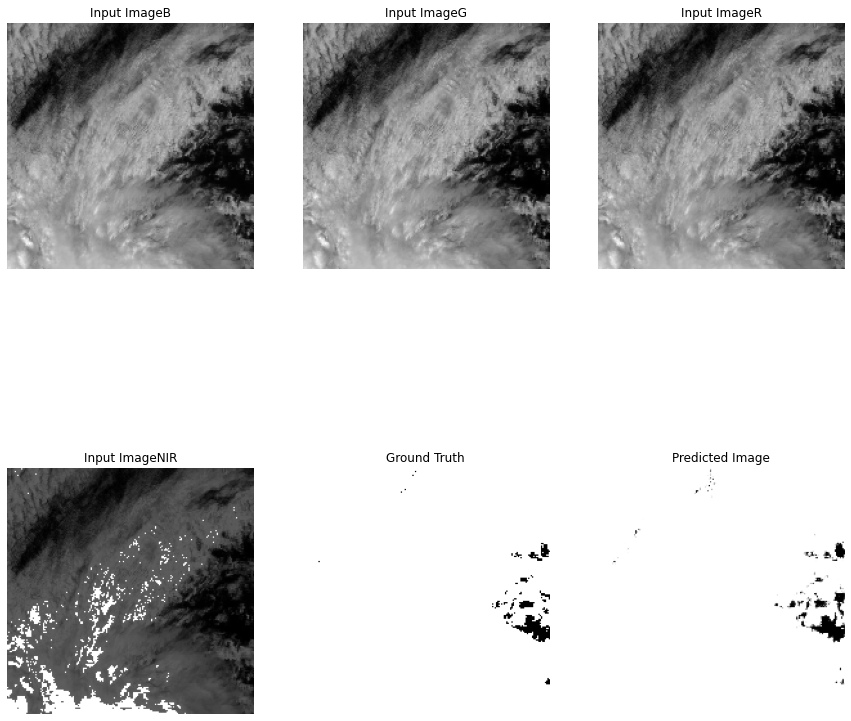

MAE_cloud_mask, RMSE_cloud_mask =  0.0070529515 0.08398185
TP, FP, FN, TN =  36137 106 154 467
IOU, precision, recall, speicificity, overall_accuracy =  0.9928565541116027 0.9970752972987887 0.9957565236560029 0.8150087260035226 0.9929470486111112
MAE, RMSE =  0.38986915 0.62175316
(1, 192, 192, 1)
(1, 192, 192, 1)


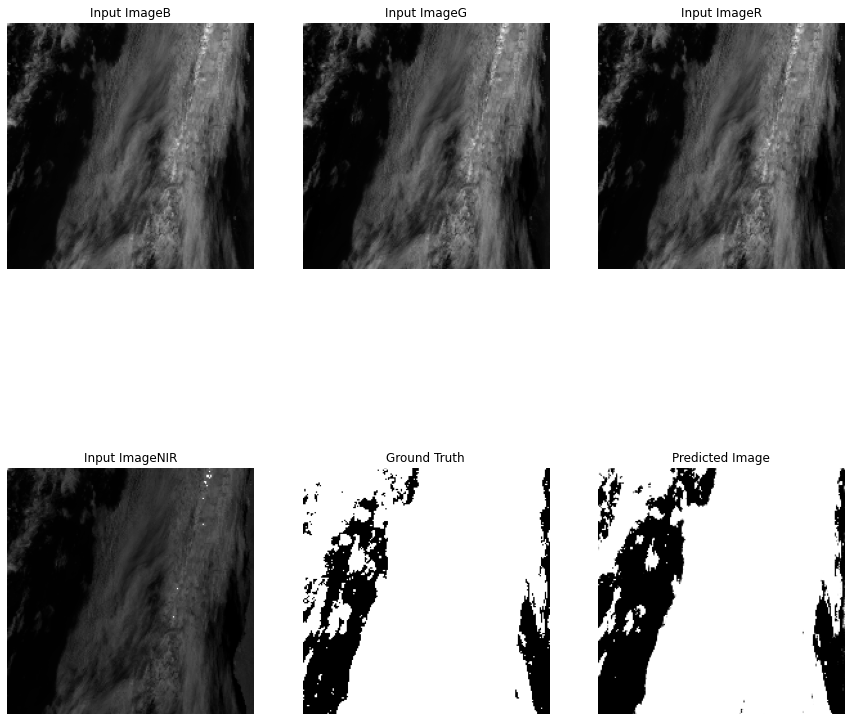

MAE_cloud_mask, RMSE_cloud_mask =  0.07128906 0.2670001
TP, FP, FN, TN =  27008 95 2533 7228
IOU, precision, recall, speicificity, overall_accuracy =  0.9113240653259552 0.9964948529683061 0.9142547645645038 0.9870271746551962 0.9287109375000002
MAE, RMSE =  0.443421 0.6616351
(1, 192, 192, 1)
(1, 192, 192, 1)


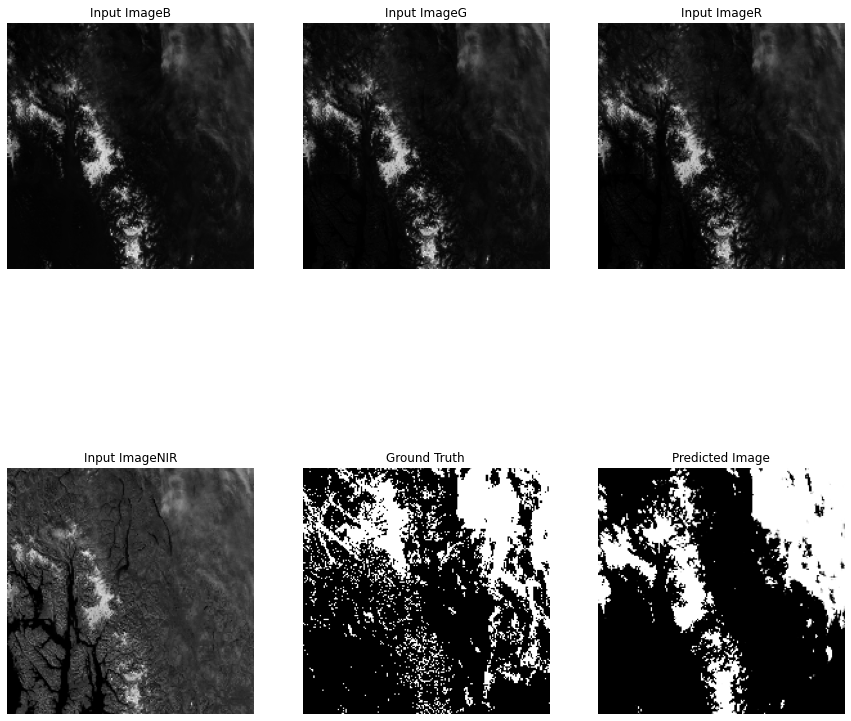

MAE_cloud_mask, RMSE_cloud_mask =  0.20388454 0.45153576
TP, FP, FN, TN =  6887 3755 3761 22461
IOU, precision, recall, speicificity, overall_accuracy =  0.47816427133236494 0.6471527908287948 0.646788129226149 0.8567668599328659 0.7961154513888894
MAE, RMSE =  0.5001925 0.7028383
(1, 192, 192, 1)
(1, 192, 192, 1)


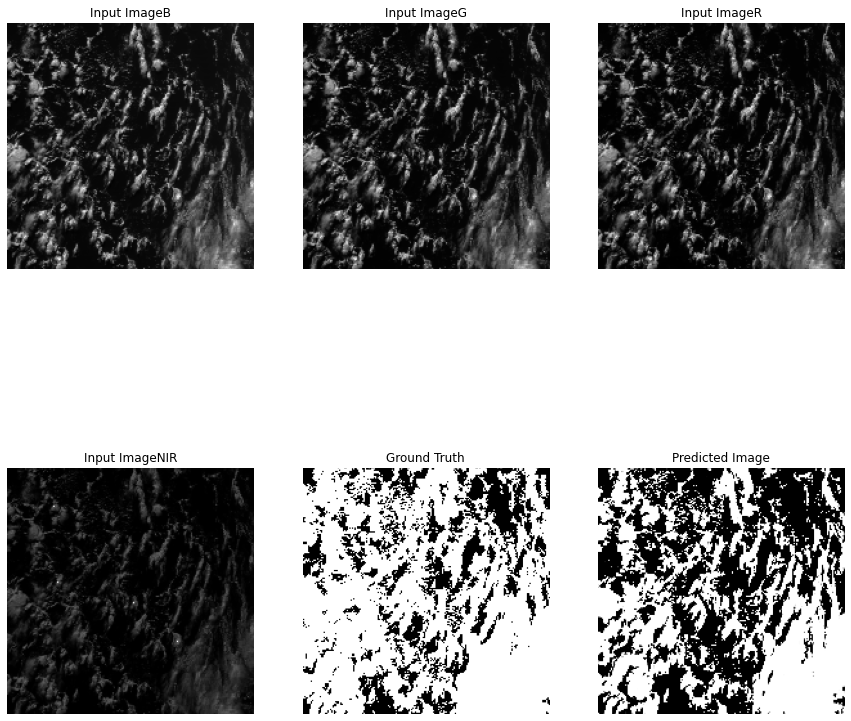

MAE_cloud_mask, RMSE_cloud_mask =  0.2350803 0.4848508
TP, FP, FN, TN =  18317 3 8663 9881
IOU, precision, recall, speicificity, overall_accuracy =  0.6788348219249168 0.9998362445414847 0.6789103039288373 0.9996964791582356 0.7649197048611117
MAE, RMSE =  0.26848766 0.5157622
(1, 192, 192, 1)
(1, 192, 192, 1)


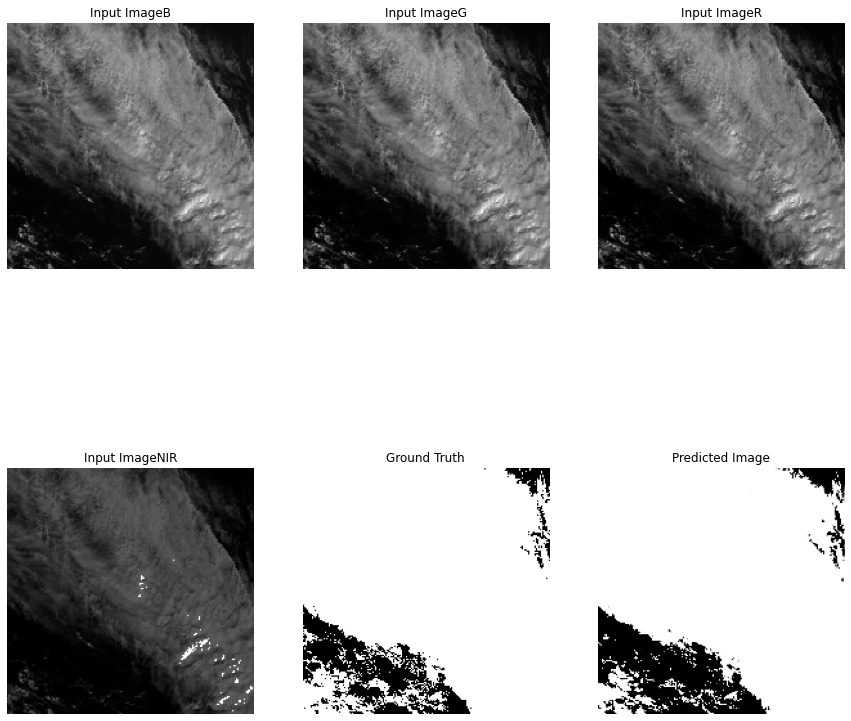

MAE_cloud_mask, RMSE_cloud_mask =  0.04087999 0.20218801
TP, FP, FN, TN =  30697 62 1445 4660
IOU, precision, recall, speicificity, overall_accuracy =  0.9532045708607628 0.997984329789655 0.9550432455976605 0.9868699703515462 0.9591200086805557
MAE, RMSE =  0.357872 0.59393716
(1, 192, 192, 1)
(1, 192, 192, 1)


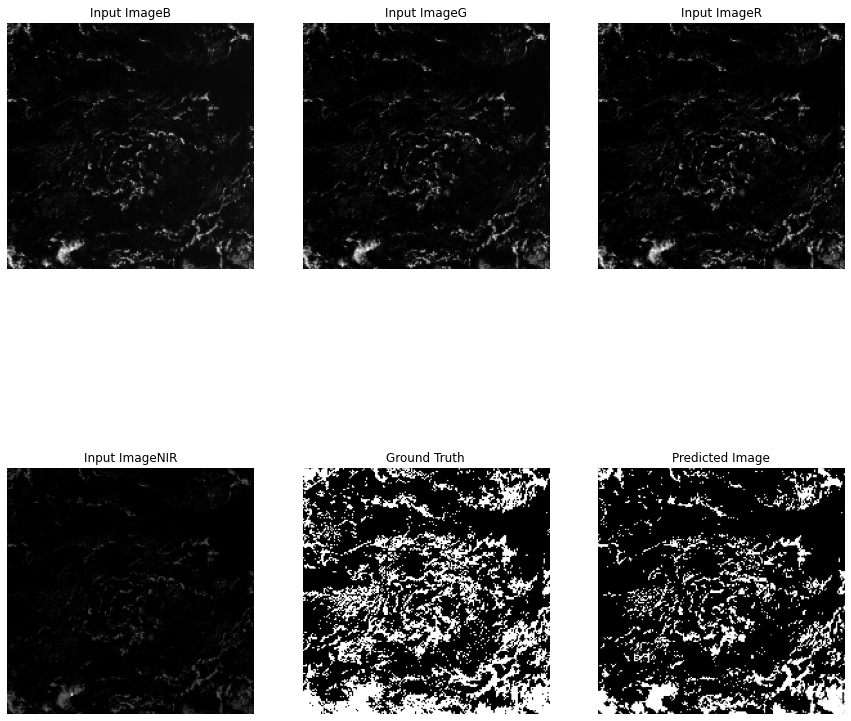

MAE_cloud_mask, RMSE_cloud_mask =  0.12996419 0.36050546
TP, FP, FN, TN =  6121 149 4642 25952
IOU, precision, recall, speicificity, overall_accuracy =  0.5609420821114409 0.9762360446570977 0.5687076094025869 0.9942914064595226 0.870035807291667
MAE, RMSE =  0.37094644 0.60472405
(1, 192, 192, 1)
(1, 192, 192, 1)


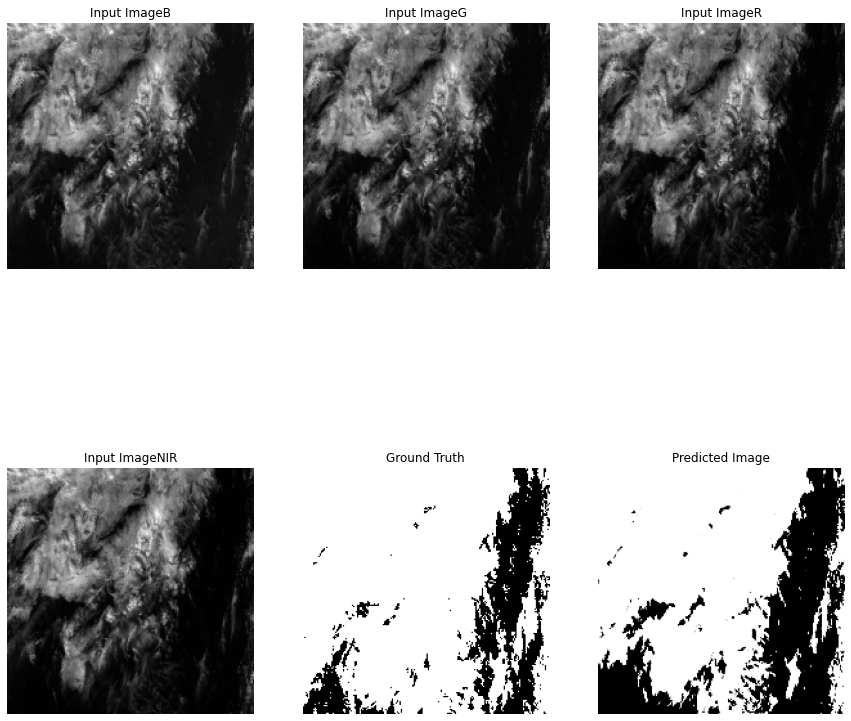

MAE_cloud_mask, RMSE_cloud_mask =  0.11496311 0.3390621
TP, FP, FN, TN =  25157 28 4210 7469
IOU, precision, recall, speicificity, overall_accuracy =  0.8558258207178097 0.998888227119317 0.8566418088330444 0.996265172735761 0.8850368923611114
MAE, RMSE =  0.18225051 0.42187124
(1, 192, 192, 1)
(1, 192, 192, 1)


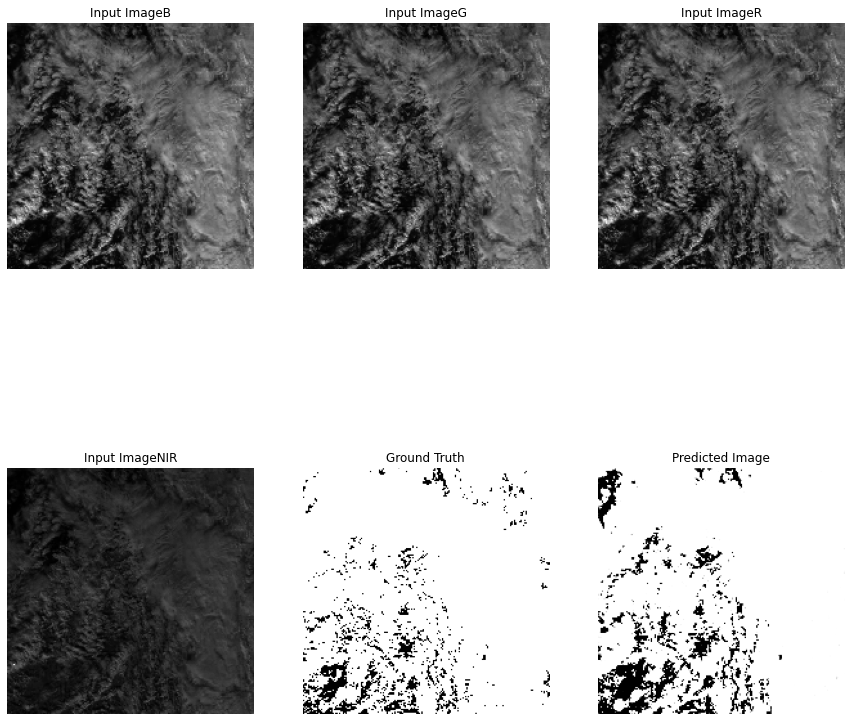

MAE_cloud_mask, RMSE_cloud_mask =  0.07069227 0.26588017
TP, FP, FN, TN =  32063 668 1938 2195
IOU, precision, recall, speicificity, overall_accuracy =  0.924831982462719 0.9795912132229385 0.9430016764212817 0.7666783094656037 0.9293077256944446
Average: IOU, precision, recall, specificity, overall acuracy =  0.8365719653044232 0.9523387359713318 0.8673513040908872 0.8612082043769039 0.9006320529513889


In [27]:
IOU_total = 0.0
precision_total = 0.0
recall_total = 0.0
specificity_total = 0.0
overall_accuracy_total = 0.0
num = 0
for example_input, example_target in test_dataset.take(20):
  IOU, precision, recall, specificity, overall_accuracy = generate_images(generator, example_input, example_target)

  IOU_total +=  IOU
  precision_total +=  precision
  recall_total +=  recall
  specificity_total +=  specificity
  overall_accuracy_total +=  overall_accuracy
  num += 1

IOU_ave = IOU_total / num
precision_ave = precision_total / num
recall_ave = recall_total / num
specificity_ave = specificity_total / num
overall_accuracy_ave = overall_accuracy_total / num

print('Average: IOU, precision, recall, specificity, overall acuracy = ', \
      IOU_ave, precision_ave, recall_ave, specificity_ave, overall_accuracy_ave)